# B8.3 Spin Angular Momentum
<hr style="height:2px;border-width:0;color:gray;background-color:gray">

## B8.3.1 Conceptual Meaning and Restrictions

We will now direct our attention to the second form of rotational motion: **spin angular momentum**. 

This is probably the main form of rotational motion we think of in daily life. For examples: the spinning of a tire, baseball, a spinning basketball balanced on a finger, or figure skater spin. 

## Conceptual Definition

All the above have one thing in commone: **they rotate about an axis that is internal to the object**, which is what we can take as a definition of spin angular motion: **it is a measure of rotational motion for an object rotating about an axis intrinsic to the object**. With that definition, we can also conclude: **a point particle cannot have spin angular momentum**, since it requires a sense of size and shape.

## Restrictions

This form of motion is quite complicated and an in-depth discussion is beyond the scope of this course. In our discussion for now, we will restrict **rigid object motion to rotation about a single, fixed axis aligned with one of the cartesian coordinate axes**.

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

## B8.3.2 Intrinsic Orbital Angular Motion for an Object Point Particle 

We will now derive the expression for the spin angular momentum with the restriction listed above. Assume an object is rotating in a counter-clockwise direction about the z-axis. Any point particles making up the object must therefore move in a circular motion with a constant z-value (that is, rotation in a xy-plane) as illustrated below.

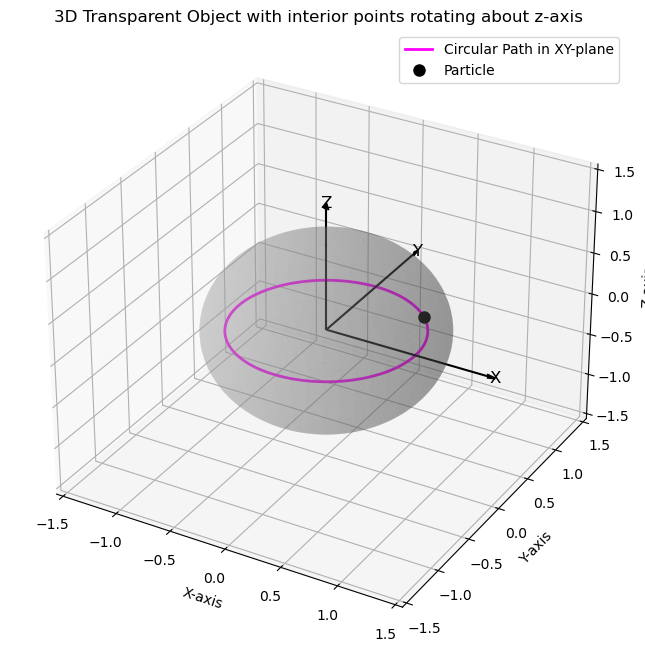

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Set up the figure and 3D axes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate data for the transparent sphere
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 100)
sphere_x = 1.0 * np.outer(np.cos(u), np.sin(v))
sphere_y = 1.0 * np.outer(np.sin(u), np.sin(v))
sphere_z = 1.0 * np.outer(np.ones(np.size(u)), np.cos(v))

# Plot the transparent sphere
ax.plot_surface(sphere_x, sphere_y, sphere_z, color='darkgray', alpha=0.3, edgecolor='none')

# Plot the XYZ coordinate axes
axis_length = 1.5
# X-axis (Red)
ax.quiver(0, 0, 0, axis_length, 0, 0, color='k', arrow_length_ratio=0.05, linewidth=1.5)
# Y-axis (Green)
ax.quiver(0, 0, 0, 0, axis_length, 0, color='k', arrow_length_ratio=0.05, linewidth=1.5)
# Z-axis (Blue)
ax.quiver(0, 0, 0, 0, 0, axis_length, color='k', arrow_length_ratio=0.05, linewidth=1.5)

# Label the axes
ax.text(axis_length, 0, 0, 'X', color='k', fontsize=12, ha='center', va='center')
ax.text(0, axis_length, 0, 'Y', color='k', fontsize=12, ha='center', va='center')
ax.text(0, 0, axis_length, 'Z', color='k', fontsize=12, ha='center', va='center')

# Generate data for the circle in the XY-plane
circle_radius = 0.8  # Radius of the circle
theta = np.linspace(0, 2 * np.pi, 100)
circle_x = circle_radius * np.cos(theta)
circle_y = circle_radius * np.sin(theta)
circle_z = np.zeros_like(theta)

# Plot the circle in the XY-plane
ax.plot(circle_x, circle_y, circle_z, color='magenta', linewidth=2, label='Circular Path in XY-plane')

# Place a point on the circle
point_x = circle_radius * np.cos(np.pi / 4)  # Adjust angle as needed
point_y = circle_radius * np.sin(np.pi / 4)
point_z = 0
ax.plot([point_x], [point_y], [point_z], 'ko', markersize=8, label='Particle')

# Set the limits of the axes
ax.set_xlim([-1.5, 1.5])
ax.set_ylim([-1.5, 1.5])
ax.set_zlim([-1.5, 1.5])

# Set labels
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Transparent Object with interior points rotating about z-axis')

# Add legend
ax.legend(loc='upper right')

# Show plot
plt.show()


The orbital angular momentum of a single point particle is

$$ \vec{l} = \vec{r}\times\vec{p} $$

Since $\vec{p} = m\vec{v} $, we have

$$ \vec{l} = m\vec{r}\times\vec{v} $$

The particle moves in a circular path and it is more intuitive to use cylindrical coordinates. The position vector in cylindrical coordinates is

$$ \vec{r} = r\hat{r} + z\hat{z} $$

and the velocity is

$$ \vec{v} = \dot{r}\hat{r} + r\dot{\theta}\hat{\theta} + \dot{z}\hat{z}$$

Since the particle moves in a circular path with constant $z$, we can simply the velocity to:

$$ \vec{v} = r\dot{\theta}\hat{\theta} $$

We may be a little bit more comfortable to write the angular speed $\dot{\theta}$ as $\omega$. We will take it one step further and write it as

$$\dot{\theta} = \omega_z $$

to enforce the notion that it is a rotation about the z-axis.

After taking the cross product, the angular momentum then becomes

$$ \vec{l} = -rz\omega_{z}\hat{r} + r^{2}\omega_{z}\hat{z} $$

We notice that the first term will vary as the particle moves around in its circular path ($\hat{r}$ constantly changes direction), while the second term remains constant (at least for constant angular speed). 

* If $z = 0$, the angular momentum is simply in the +z-direction as expected from the right-hand-rule.
* If $z \neq 0$, then the angular momentum vector will precess about the z-axis.

The animation below illustrates an example of this behavior.

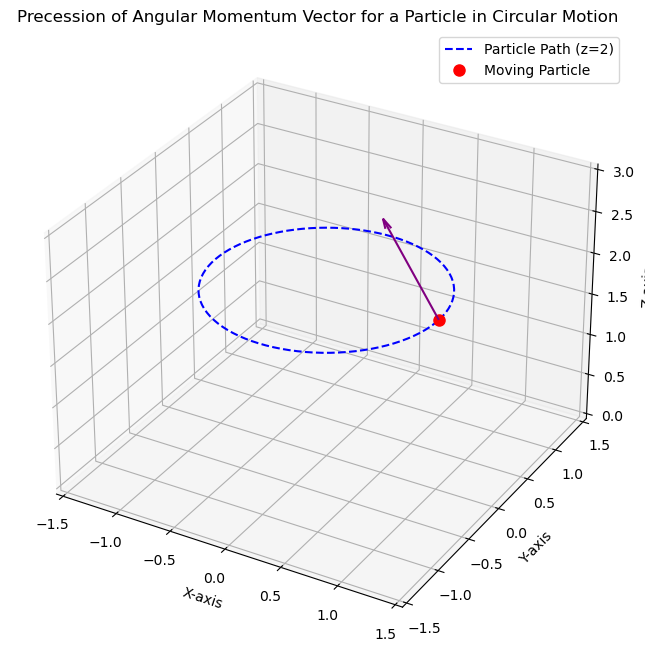

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Parameters for the particle's motion and angular momentum precession
radius = 1.0  # Radius of the circular path
z_height = 2  # Constant z position for the circular motion
angular_velocity = 1.0  # Angular velocity of the particle
precession_rate = 1.0  # Rate at which the angular momentum vector precesses

# Set up the figure and 3D axes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

# Generate circle path in the XY-plane at z = z_height
theta = np.linspace(0, 2 * np.pi, 100)
circle_x = radius * np.cos(theta)
circle_y = radius * np.sin(theta)
circle_z = np.full_like(theta, z_height)

# Plot the circle path
ax.plot(circle_x, circle_y, circle_z, color="blue", linestyle="--", label="Particle Path (z=2)")

# Initialize particle and angular momentum vector (arrow) at the starting point
particle, = ax.plot([], [], [], "ro", markersize=8, label="Moving Particle")
angular_momentum_vector = ax.quiver(0, 0, z_height, 0, 0, 0, color="purple", arrow_length_ratio=0.1, label="Angular Momentum Vector (L)")

# Set limits and labels for the axes
ax.set_xlim([-1.5, 1.5])
ax.set_ylim([-1.5, 1.5])
ax.set_zlim([0, 3])
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Z-axis")
ax.set_title("Precession of Angular Momentum Vector for a Particle in Circular Motion")

# Function to update particle position and angular momentum vector in animation
def update(frame):
    # Particle's current position on the circle
    x = radius * np.cos(frame * angular_velocity)
    y = radius * np.sin(frame * angular_velocity)
    z = z_height
    particle.set_data([x], [y])
    particle.set_3d_properties([z])

    # Calculate the angular momentum vector precession around the z-axis
    L_magnitude = 0.5  # Arbitrary length for visualization
    L_x = -L_magnitude * np.cos(frame * precession_rate)
    L_y = -L_magnitude * np.sin(frame * precession_rate)
    L_z = z_height / 2  # Keep it proportional for visualization

    # Update the angular momentum vector (arrow)
    global angular_momentum_vector
    angular_momentum_vector.remove()  # Remove the previous arrow
    angular_momentum_vector = ax.quiver(x, y, z_height, L_x, L_y, L_z, color="purple", arrow_length_ratio=0.1)

    return particle, angular_momentum_vector

# Animate the particle's motion along the circular path and precession of the angular momentum vector
frames = np.linspace(0, 2 * np.pi, 100)
ani = FuncAnimation(fig, update, frames=frames, interval=100, blit=True)

# Add legend
ax.legend(loc="upper right")


from IPython.display import HTML
HTML(ani.to_jshtml())


### Further Restrictions

The precession of the particle's angular momentum is a little too much to handle at first, so let us focus on the constant term only: the z-component of the angular momentum:

$$ l_z = r^{2}m\omega_z $$

<div class="alert alert-danger">
    
Remember that this was derived using cylindral coordinate and $r$ is not the length of the position vector, but the radial distance in the polar plane.  
</div>

With that in mind, we can continue to the system of particles after a few quick problems.
<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div style="background-color: #D0D0D0 ; padding: 10px; border: 1px solid black;">       
<header>
<h3> Example 1</h3>
    </header>
    
A point particle of mass 0.5 kg is moving in a circular motion in the xy-plane with radius 0.5 m and an angular speed of 25 rad/s. What is its angular momentum around the z-axis?

**Solution**
    
We note that the particle is rotating about the z-axis since it is confined to the xy-plane.

$$ l_z = r^2m\omega_{z} = (0.5)^{2}(0.5)(25) = 3~\textrm{kgm$^2$/s} $$
</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 1</b><br>
    
A turntable disk is spinning at a rate of $5.0~\textrm{rev/s}$. There is a bug with a mass of 5.0 g on the turntable at location 8 cm from the center of the disk.

1. Convert the angular speed from rev/s to rad/s.
2. Consider the bug to be point particle, what is its angular momentum about the rotation axis?

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 2</b><br>
    
   <img src="lhc.jpg" width="300">
    
At full power, trillions of protons will race around the <a href="https://home.cern/science/accelerators/large-hadron-collider">Large Hadron Collider (LHC)</a> accelerator ring 11,245 times a second, travelling at 99.9999991$\%$ the speed of light. The collider is contained in a circular tunnel, with a circumference of 26.7 kilometers. What is the angular momentum of a single proton (considered a point particle) around the axis of rotation? You will need to look up the mass of a proton.
</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

## B8.3.3 Discrete System

For a discrete system, we can sum the z-component of the angular momentum up:

$$ L_z = \sum l_z = \sum (r_{i}^{2}m_{i}\omega_{z_i}) $$

For a **rigid object**, the angular speed **must** be the same for each point particle as they sweep through the same angular distance in the same amount of time. If the rotation rate of the object is $\Omega_z$, then we have

$$ L_z = \sum l_z = \left(\sum r_{i}^{2}m_{i}\right)\Omega_z $$
    
The term in the parenthesis is defined as the **system's moment of inertia** about the z-axis:

<div class="alert alert-success">
    
$$ I_{zz} = \sum r_{i}^{2}m_{i} $$
</div>

We can then write the angular momentum component as

<div class="alert alert-success">

$$ L_z = I_{zz}\Omega_z $$
    
</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div style="background-color: #D0D0D0 ; padding: 10px; border: 1px solid black;">       
<header>
<h3> Example 2</h3>
    </header>
    
Two particles are moving in circular motions but opposite directions. Particle A has a mass of 1.0 kg and is traveling in CCW direction with a rotational speed of 2.0 rad/s at a radius of 0.1 cm. Particle B has a mass of 0.25 kg and is traveling in CW direction with an angular speed of 5.0 rad/s at a radius of 0.5 cm. What is the rotational momentum of this system.

**Solution**
    
Let us consider CCW direciton to be positive, that implies that particle A has a **positive** angular velocity component and particle B has a **negative** angular velocity component. We will also say that the particles are moving in the xy-plane and the angular momentum is therefore equivalent to finding the z-component.

The total angular momemtum is 

$$ L_z = l_{1,z} + l_{2,z} $$

$$ L_z = r_{1}^{2}m_{1}\omega_{1,z} + r_{2}^{2}m_{2}\omega_{2,z} $$

$$ L_z = (0.001)^{2}(1.0)(2.0) + (0.005)^{2}(0.25)(-5.0) = 0.003~\textrm{kgm$^2$/s} $$

</div>
<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 2</b><br>
    
A turntable disk is spinning at a rate of $5.0~\textrm{rev/s}$. There is a 5.0 g bug on the turntable at location 8 cm from the center of the disk. A second identical bug is positioned at a loction of 4 cm from the center of the disk. What is the magnitude of the angular momentum of the system of bugs? HINT: Remember to convert the angular speed to rad/s. 

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 3</b><br>
    
Two point objects A and B with masses 2.0 kg and 3.0 kg, respectively, are moving in circular motions with radii 0.5 m and 0.75 m, respectively. Object A is moving in a CW direction at 5.0 rad/s while object B is moving in a CCW direction at 8.0 rad/s. What is the angular momentum of this system?

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

## B8.3.4 Continuous System

For a continuous system, we must integrate over each infinitesimal point masses:

$$ L_z = \int dl_z = \left(\int r^{2}dm\right)\Omega_z $$

where the moment of inertia about the z-axis now becomes

<div class="alert alert-success">
    
$$ I_{zz} =\int r^2dm $$
</div>

and the angular momentum component is

<div class="alert alert-success">

$$ L_z = I_{zz}\Omega_z $$
    
</div>

<div class="alert alert-info">
    
Calculations of the moment of inertia often requires multiple variable calculus, but are easily found in tables for the most common objects. 
</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div style="background-color: #D0D0D0 ; padding: 10px; border: 1px solid black;">       
<header>
<h3> Example 3</h3>
    </header>
    
A turntable disk with a mass of 10.0 kg and radius 15 cm is spinning at a rate of $8.0~\textrm{rad/s}$. What is the rotational momentum of the disk?

**Solution**
    
We will need to know the moment of inertia of a disk. From looking it up in a table, we determine that the moment of inertia of a disk rotating about an axis through its center and perpendicular to the plane of the disk to be:

$$ I_{disk} = \frac{1}{2}MR^2 $$

If we let the plane of the disk to be in the xy-plane, then the rotational momentum is along the z-axis and is:

$$ L_z = I_{zz}\Omega_{z} $$

$$ L_z = \frac{1}{2}MR^2\Omega_{z} $$

$$ L_z = (0.5)(10.0)(0.15)^2(8.0) = 0.90~\textrm{kgm$^2$/s} $$
</div>
<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 4</b><br>
    
A turntable disk with a mass of 10.0 kg and radius 15 cm is spinning at a rate of $8.0~\textrm{rad/s}$. There is a 5.0 g bug on the turntable at location 8 cm from the center of the disk. A second identical bug is positioned at a loction of 4 cm from the center of the disk. What is the magnitude of the angular momentum of the total system (turntable and bugs)? HINT: the total angular momentum is the sum of individual momenta. 

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 5</b><br>
    
A solid sphere of mass 5.0 kg and radius 5.0 cm is spinning at a rate of 20 rad/s about an axis through its center. What is the angular momentum of the sphere around the rotation axis?

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 6</b><br>
        
A solid sphere of mass 5.0 kg and radius 5.0 cm is rotating at a rate of 20 rad/s about an axis that is shifted a distance of 25 cm away from the center of the sphere. Assume the sphere is in tidal lock (that is, the orbital and spin angular speeds are the same). What is the angular momentum of the sphere around this axis?  
</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<div class="alert alert-warning">
<b>Box 7</b><br> 
    
A solid sphere of mass 5.0 kg and radius 5.0 cm is attached to the end of a rod of mass 2.0 kg and length 0.5 m. The system is in the horizontal xy-plane and spinning around an axis perpendicalur to this plane and through the end point of the rod opposite to the sphere. If the system is rotating at a rate of 20 rad/s what is the angular momentum of the system around this axis? <br>

</div>

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

## B8.3.5 Conceptual Meaning of Moment of Inertia

We recall from linear motion that we have

$$ P_x = MV_x $$

for the linear momentum and mass is **the resistance to a change in linear motion**.

Similarly, we now have

$$ L_z = I_{zz}\Omega_Z $$

and the moment of inertia is **the resistance to a change in rotational motion**.

Keep in mind the moment of inertia **depends on both mass and how the mass is distributed**.

<hr style="height:2px;border-width:0;color:gray;background-color:gray">